In [53]:
import csv
import gc
import os
import pathlib

import cv2
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from ultralytics import YOLO
import contextily as ctx

In [5]:
%matplotlib widget

In [33]:
source_dir = "D:/cassda-data/street-tiles/DE/images"
output_dir = "../model/runs/cassda-wildlife-crossing/yolo11-DE-conf0_35"

In [34]:
os.makedirs(output_dir, exist_ok=True)

In [35]:
model = YOLO(
    "../model/runs/cassda-wildlife-crossing/yolo11n-obb-wildlife_bridges-filtered-dataset-no-CH/weights/best.pt"
)

In [83]:
results = model.predict(source=source_dir, conf=0.35, save=False, stream=True)

In [84]:
with open(f"{output_dir}/detection_results.csv", mode="w", newline="") as csv_file:
    fieldnames = [
        "image_path",
        "obb_xyxyxyxy",
        "obb_x",
        "obb_y",
        "obb_w",
        "obb_h",
        "obb_r",
        "confidence",
    ]
    writer = csv.DictWriter(csv_file, fieldnames=fieldnames)
    writer.writeheader()

processed_count = 0
with open(f"{output_dir}/detection_results.csv", mode="a", newline="") as csv_file:
    fieldnames = [
        "image_path",
        "obb_xyxyxyxy",
        "obb_x",
        "obb_y",
        "obb_w",
        "obb_h",
        "obb_r",
        "confidence",
    ]
    writer = csv.DictWriter(csv_file, fieldnames=fieldnames)
    for r in results:
        print(f"Processing image: {r.path}")
        processed_count += 1

        if r.obb is None:
            continue

        num_detections = len(r.obb)
        if num_detections == 0:
            continue
        
        for i in range(num_detections):
            img_path = pathlib.Path(r.path).name
            obb = r.obb[i].xywhr.tolist()[0]
            obb_x = obb[0]
            obb_y = obb[1]
            obb_w = obb[2]
            obb_h = obb[3]
            obb_r = obb[4]

            res_dict = {
                "image_path": img_path,
                "obb_xyxyxyxy": r.obb[i].xyxyxyxy.tolist()[0],
                "obb_x": obb_x,
                "obb_y": obb_y,
                "obb_w": obb_w,
                "obb_h": obb_h,
                "obb_r": obb_r,
                "confidence": float(r.obb[i].conf),
            }
            writer.writerow(res_dict)

        del r
        if processed_count % 50 == 0:
            gc.collect()            # Force garbage collection
            torch.cuda.empty_cache() # Clear GPU memory


image 1/17682 D:\cassda-data\street-tiles\DE\images\4011451_2690862_4012731_2692142.jpg: 640x640 (no detections), 29.1ms
Processing image: D:\cassda-data\street-tiles\DE\images\4011451_2690862_4012731_2692142.jpg
image 2/17682 D:\cassda-data\street-tiles\DE\images\4011997_2691687_4013277_2692967.jpg: 640x640 (no detections), 21.0ms
Processing image: D:\cassda-data\street-tiles\DE\images\4011997_2691687_4013277_2692967.jpg
image 3/17682 D:\cassda-data\street-tiles\DE\images\4012821_2692207_4014101_2693487.jpg: 640x640 (no detections), 21.5ms
Processing image: D:\cassda-data\street-tiles\DE\images\4012821_2692207_4014101_2693487.jpg
image 4/17682 D:\cassda-data\street-tiles\DE\images\4013402_2812058_4014682_2813338.jpg: 640x640 (no detections), 21.0ms
Processing image: D:\cassda-data\street-tiles\DE\images\4013402_2812058_4014682_2813338.jpg
image 5/17682 D:\cassda-data\street-tiles\DE\images\4013738_2692599_4015018_2693879.jpg: 640x640 (no detections), 21.1ms
Processing image: D:\cassd

KeyboardInterrupt: 

#### Remove Duplicates in Predictions

In [85]:
results_df = pd.read_csv(f"{output_dir}/detection_results.csv")

In [86]:
results_df.reset_index(drop=True, inplace=True)
results_df.head()

,image_path,obb_xyxyxyxy,obb_x,obb_y,obb_w,obb_h,obb_r,confidence
0,4021161_2906024_4022441_2907304.jpg,"[[186.62759399414062, 349.8382263183594], [196...",190.269012,332.872711,33.121853,10.358644,1.479118,0.406358
1,4024916_2954868_4026196_2956148.jpg,"[[21.25598907470703, 632.4171752929688], [30.6...",20.274311,621.671509,17.889729,12.070222,0.886149,0.394453
2,4027846_2926611_4029126_2927891.jpg,"[[378.41082763671875, 389.8757629394531], [387...",391.346100,386.277252,23.274406,13.393406,2.348081,0.452412
3,4028255_2940470_4029535_2941750.jpg,"[[572.986083984375, 304.01318359375], [591.759...",583.459167,294.519714,21.047697,18.874413,1.674204,0.390990
4,4028592_2923854_4029872_2925134.jpg,"[[335.5446472167969, 306.0475769042969], [338....",325.900635,296.967377,23.502918,12.224571,0.275673,0.585661


In [87]:
def get_detection_center_coords(detection):
    xmin, ymin, xmax, ymax = (
        os.path.basename(detection["image_path"]).replace(".jpg", "").split("_")
    )
    xc = detection["obb_x"]
    yc = detection["obb_y"]

    xc_epsg3035 = int(xmin) + (int(xc) * 2)
    yc_epsg3035 = int(ymin) - (int(yc) * 2)

    return xc_epsg3035, yc_epsg3035

In [88]:
results_df["xc_epsg3035"], results_df["yc_epsg3035"] = zip(
    *results_df.apply(get_detection_center_coords, axis=1)
)
results_df.head()

,image_path,obb_xyxyxyxy,obb_x,obb_y,obb_w,obb_h,obb_r,confidence,xc_epsg3035,yc_epsg3035
0,4021161_2906024_4022441_2907304.jpg,"[[186.62759399414062, 349.8382263183594], [196...",190.269012,332.872711,33.121853,10.358644,1.479118,0.406358,4021541,2905360
1,4024916_2954868_4026196_2956148.jpg,"[[21.25598907470703, 632.4171752929688], [30.6...",20.274311,621.671509,17.889729,12.070222,0.886149,0.394453,4024956,2953626
2,4027846_2926611_4029126_2927891.jpg,"[[378.41082763671875, 389.8757629394531], [387...",391.346100,386.277252,23.274406,13.393406,2.348081,0.452412,4028628,2925839
3,4028255_2940470_4029535_2941750.jpg,"[[572.986083984375, 304.01318359375], [591.759...",583.459167,294.519714,21.047697,18.874413,1.674204,0.390990,4029421,2939882
4,4028592_2923854_4029872_2925134.jpg,"[[335.5446472167969, 306.0475769042969], [338....",325.900635,296.967377,23.502918,12.224571,0.275673,0.585661,4029242,2923262


In [89]:
results_gdf = results_df.copy()
results_gdf["geometry"] = gpd.points_from_xy(
    results_gdf["xc_epsg3035"], results_gdf["yc_epsg3035"], crs="EPSG:3035"
)
results_gdf = gpd.GeoDataFrame(results_gdf, geometry="geometry")

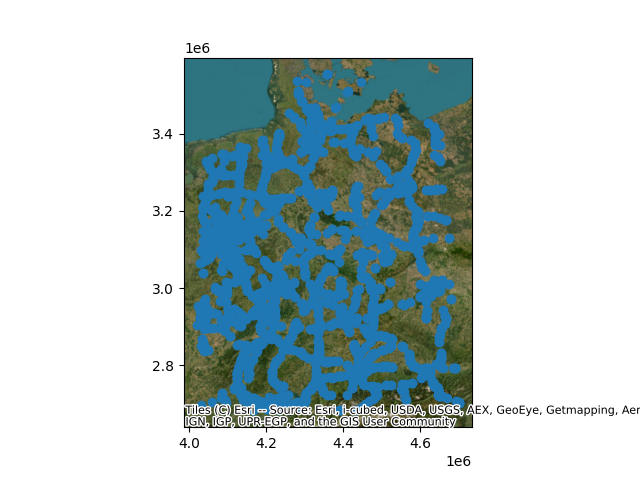

In [43]:
results_gdf.plot()
ctx.add_basemap(
    ax=plt.gca(),
    crs=results_gdf.crs.to_string(),
    source=ctx.providers.Esri.WorldImagery,
)

In [44]:
# filter based on distance of detection_center
def filter_duplicate_detections(results_df, min_distance: int):
    distance_matrix = results_df.geometry.apply(
        lambda geom: results_df.geometry.distance(geom)
    )
    to_drop = set()
    for i in range(len(distance_matrix)):
        if i in to_drop:
            continue
        for j in range(i + 1, len(distance_matrix)):
            if distance_matrix.iat[i, j] < min_distance:
                to_drop.add(j)
    return results_df.drop(index=to_drop)

In [90]:
print(f"Number of detections before filtering: {len(results_gdf)}")
df_filtered = filter_duplicate_detections(results_gdf, min_distance=10)
print(f"Number of detections after filtering: {len(df_filtered)}")

Number of detections before filtering: 436
Number of detections after filtering: 356


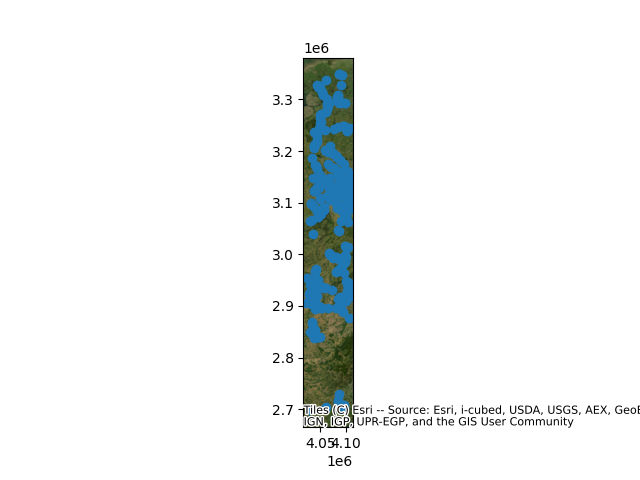

In [91]:
df_filtered.plot()
ctx.add_basemap(
    ax=plt.gca(),
    crs=df_filtered.crs.to_string(),
    source=ctx.providers.Esri.WorldImagery,
)

In [92]:
df_filtered.to_csv(f"{output_dir}/detection_results_filtered.csv", index=False)

In [126]:
def plot_detection_subset(detections_subset, nrows, ncols):
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 20))
    axs = axs.flatten()

    for r, ax in zip(detections_subset, axs):
        img = cv2.imread(os.path.join(source_dir, r.get("image_path")))
        ax.imshow(img)
        polygon = json.loads(r.get("obb_xyxyxyxy"))
        cx, cy, w, h = r.get("obb_x"), r.get("obb_y"), r.get("obb_w"), r.get("obb_h")
        poly=plt.Polygon(
            np.array(polygon).reshape(-1, 2),
            fill=False,
            edgecolor="red",
            linewidth=0.5,
        )
        ax.add_patch(poly)

        # add confidence to the polygon
        conf = r.get("confidence")
        ax.text(
            cx + w / 2,
            cy - h / 2,
            f"{conf:.2f}",
            fontsize=12,
            color="red",
            ha="center",
            va="bottom",
        )
        ax.axis("off")
    plt.tight_layout()
    plt.show()

In [94]:
detections = df_filtered.to_dict('records')
list(detections[0].keys())

['image_path',
 'obb_xyxyxyxy',
 'obb_x',
 'obb_y',
 'obb_w',
 'obb_h',
 'obb_r',
 'confidence',
 'xc_epsg3035',
 'yc_epsg3035',
 'geometry']

In [123]:
# create plot with 3 columns and 10 rows, repeat until all images are plotted
ncols = 3
nrows = 5
imgs_per_plot = ncols * nrows
num_plots = (len(detections) + imgs_per_plot - 1) // imgs_per_plot

def get_idx(plot_id, num_images, imgs_per_plot):
    start_idx = plot_id * imgs_per_plot
    end_idx = min(start_idx + imgs_per_plot, num_images)
    return start_idx, end_idx

Plotting images 0 to 15 out of 356


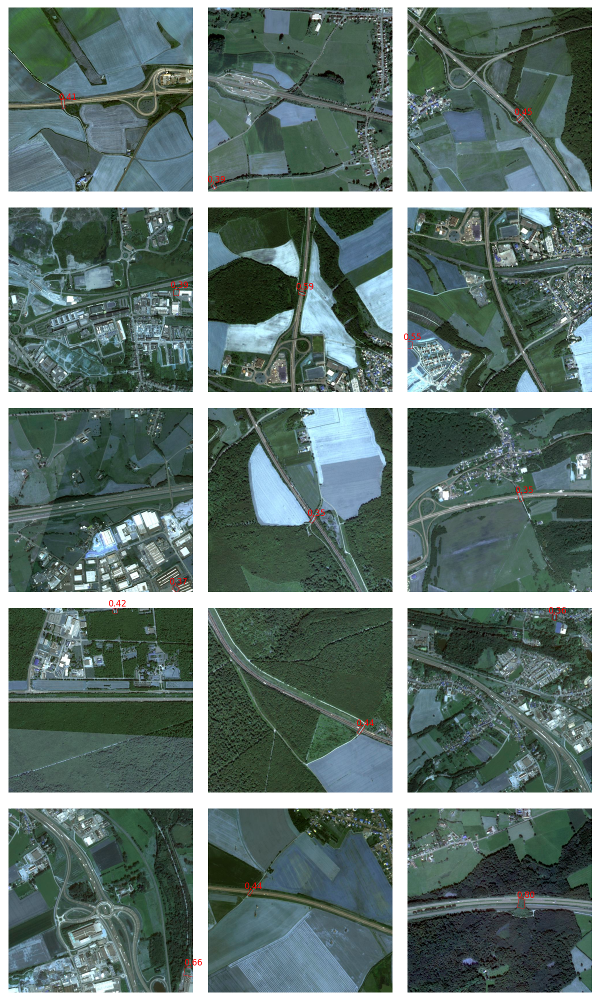

In [127]:
plot_id = 0  # Change this value to view different subsets
start_idx, end_idx = get_idx(plot_id, len(detections), imgs_per_plot)
detections_subset = detections[start_idx:end_idx]

print(f"Plotting images {start_idx} to {end_idx} out of {len(detections)}")
plot_detection_subset(detections_subset, nrows, ncols)